In [1]:
import sys
sys.path.append('..')

from EBC import EBC

In [90]:
import matplotlib.pyplot as plt
import mdtraj as md
import numpy as np

from rdkit import Chem
from rdkit.Chem import AllChem

In [3]:
N = 2500
OFFSET = 0
TEMPERATURE = 2000

In [107]:
SMILE = "CC(C)CC(C(=O)O)N"#"C1=CC=C(C=C1)COC2=C(N=CC=C2)N" # 
SYSTEM_NAME = 'leucine'#'3BPA'

mol = Chem.MolFromSmiles(SMILE)
mol = Chem.AddHs(mol)

In [108]:
# Use RDKit:
# - Conformation Generation
# - Alignment
# - Calculate Energy/Relax (check maxIters)
AllChem.EmbedMultipleConfs(mol, numConfs=N, useExpTorsionAnglePrefs=False, useBasicKnowledge=True) 
AllChem.AlignMolConformers(mol, atomIds=list(range(mol.GetNumHeavyAtoms())), reflect=True)
conformations_all = np.array([x.GetPositions() for x in mol.GetConformers()])
conformations = conformations_all[:, :mol.GetNumHeavyAtoms()]
conv, energy = np.split(np.array(AllChem.MMFFOptimizeMoleculeConfs(mol, maxIters=0)), 2, axis=-1)
#energy = energy[np.where(~conv.astype(bool))] 
#energy -= OFFSET
#conformations = conformations[np.where(~conv.astype(bool))]
energy -= np.amin(energy) # kJ or kcal?
conformations.shape

(2500, 9, 3)

In [109]:
Chem.MolToPDBFile(mol, SYSTEM_NAME + '.pdb')

In [110]:
names_alpha = ['C12', 'C8', 'O1', 'C7']
names_beta = ['C8', 'O1', 'C7', 'C4']
names_gamma = ['O1', 'C7', 'C4', 'C3']

In [111]:
topology = md.load(SYSTEM_NAME + '.pdb').topology
trajectory = md.Trajectory(conformations_all * 0.1, topology)
atom_labels = np.array([a.name for a in topology.atoms])

In [112]:
indices_alpha = np.hstack([np.where(atom_labels == name) for name in names_alpha])
indices_beta = np.hstack([np.where(atom_labels == name) for name in names_beta])
indices_gamma = np.hstack([np.where(atom_labels == name) for name in names_gamma])

In [113]:
indices_alpha, indices_beta, indices_gamma, atom_labels

(array([[6]]),
 array([[6, 3]]),
 array([[6, 3, 2]]),
 array(['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'O1', 'O2', 'N1', 'H1', 'H2',
        'H3', 'H4', 'H5', 'H6', 'H7', 'H8', 'H9', 'H10', 'H11', 'H12',
        'H13'], dtype='<U3'))

In [114]:
angles_alpha = md.compute_dihedrals(trajectory, indices_alpha) + np.pi #% (2 * np.pi)#
angles_beta = md.compute_dihedrals(trajectory, indices_beta) + np.pi# % (2 * np.pi)# 
angles_gamma = md.compute_dihedrals(trajectory, indices_gamma) + np.pi
dihedrals = np.concatenate((angles_alpha, angles_beta, angles_gamma), axis=-1)

ValueError: indices must be shape (Any, 4). You supplied  (1, 1)

In [125]:
ebc = EBC(temperature=100, proto_radius=0.1, n_clusters=5, pca_components=2) 
ebc.fit(conformations, energy)

Using 2 components, explaining 45.7% of variance
Using 782 proto clusters.


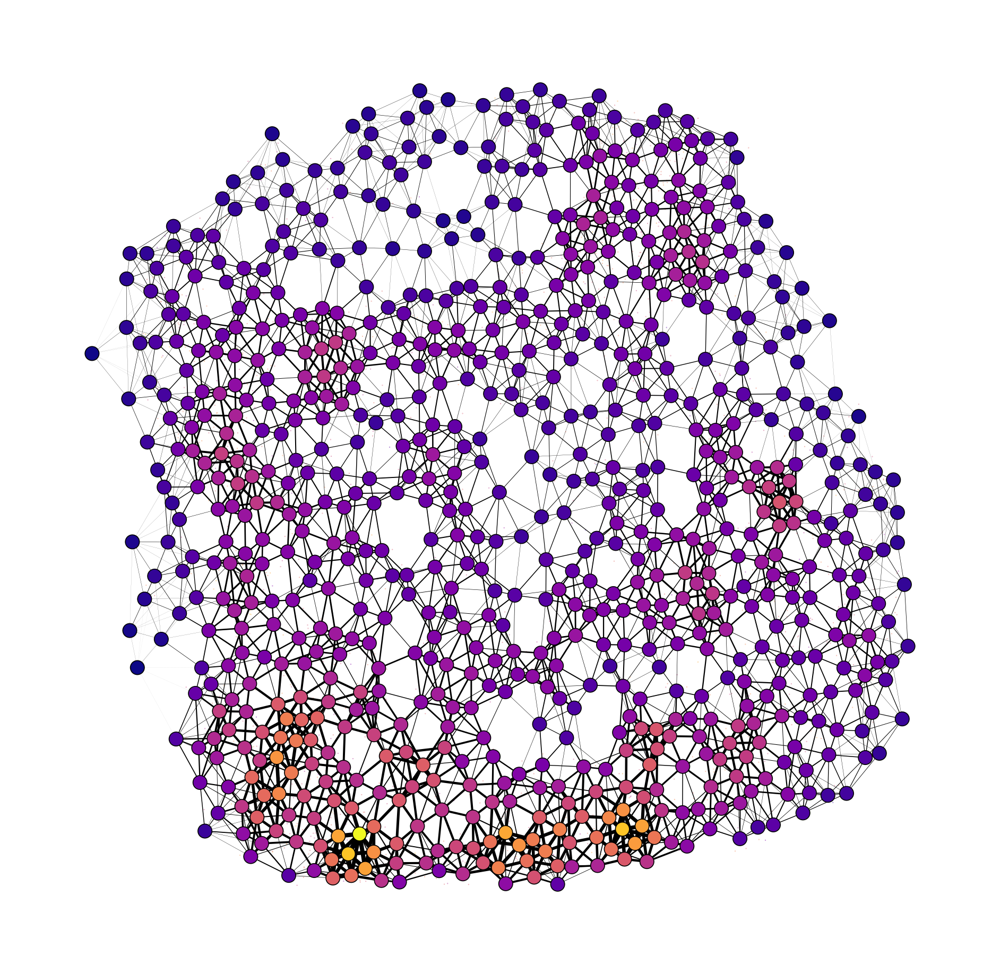

In [126]:
# Show connectivity between proto_clusters, might be used to inform n_clusters in the next step
ebc.plot_graph(tau=1, show_labels=False)

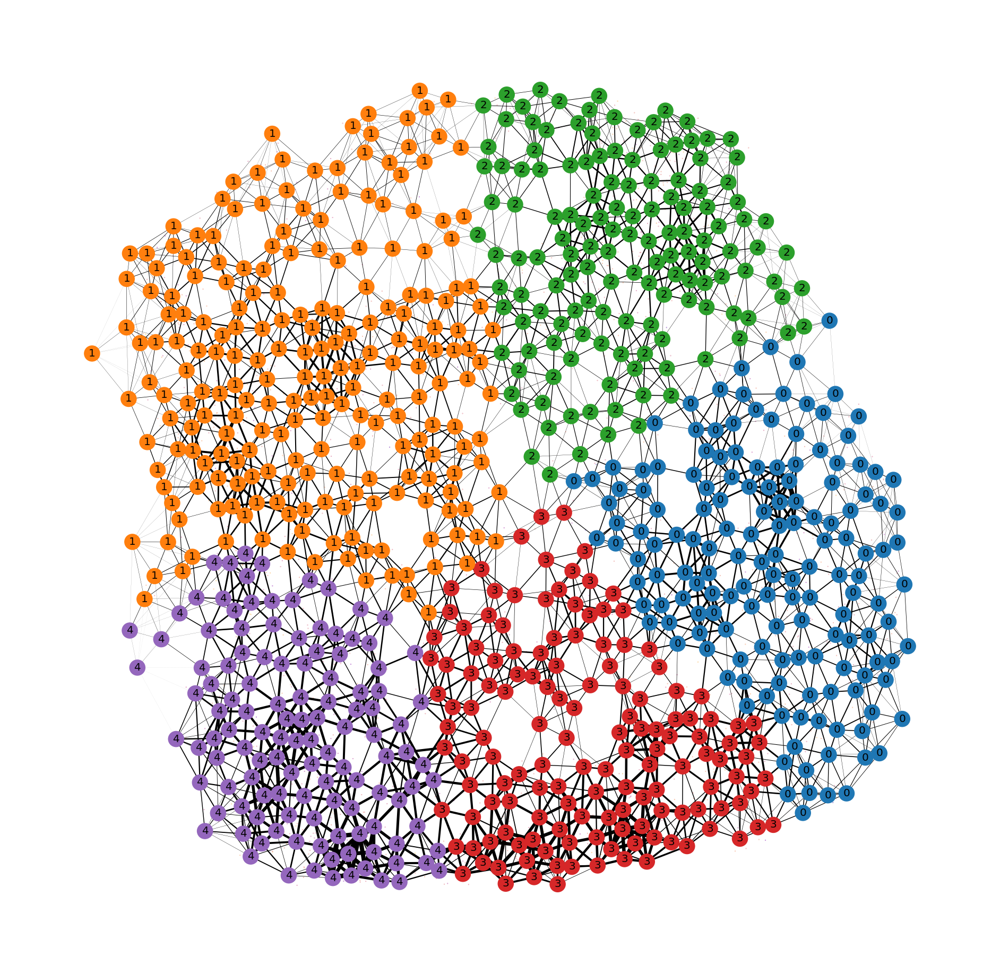

In [127]:
# Show connectivity between proto_clusters, might be used to inform n_clusters in the next step
ebc.plot_graph(tau=1, show_labels=True)

In [103]:
ebc = EBC(temperature=20, proto_radius=0.3, n_clusters=5, pca_components=3, boxsize=2 * np.pi, ) 
ebc.fit(dihedrals, energy)

Using 945 proto clusters.


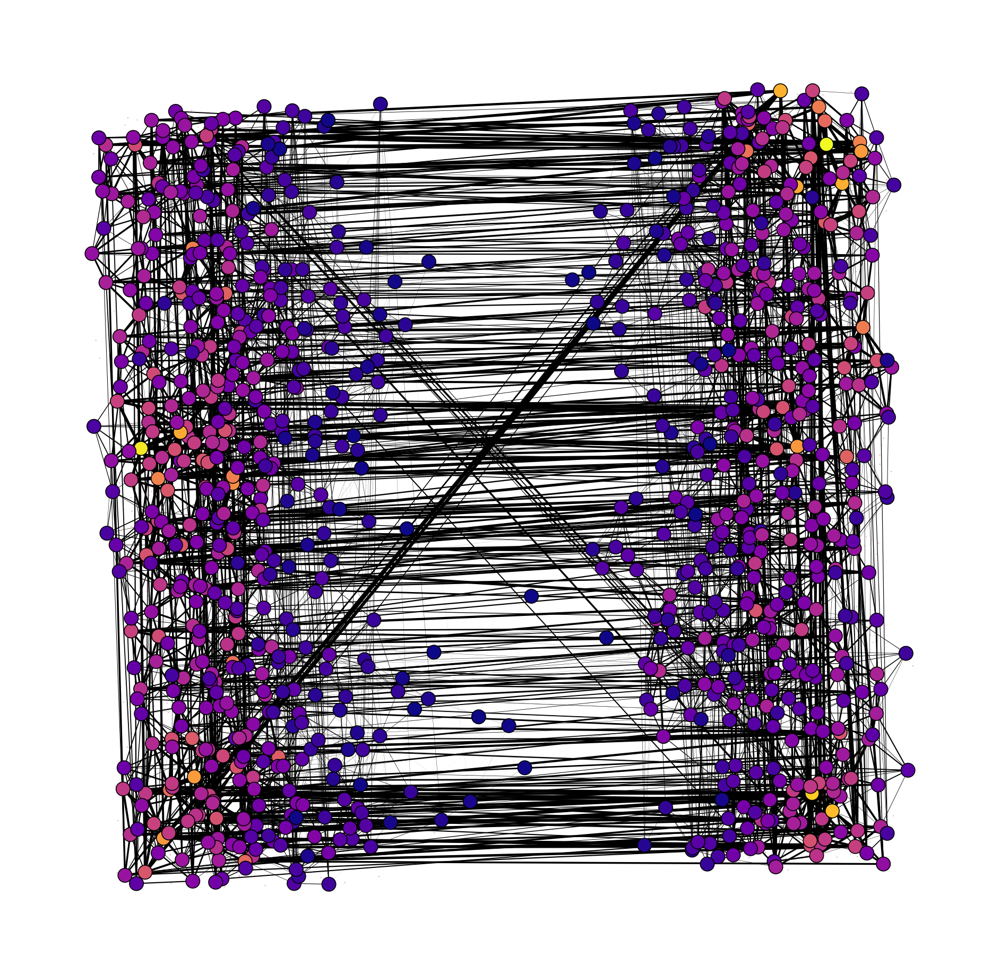

In [104]:
# Show connectivity between proto_clusters, might be used to inform n_clusters in the next step
ebc.plot_graph(tau=1, show_labels=False)

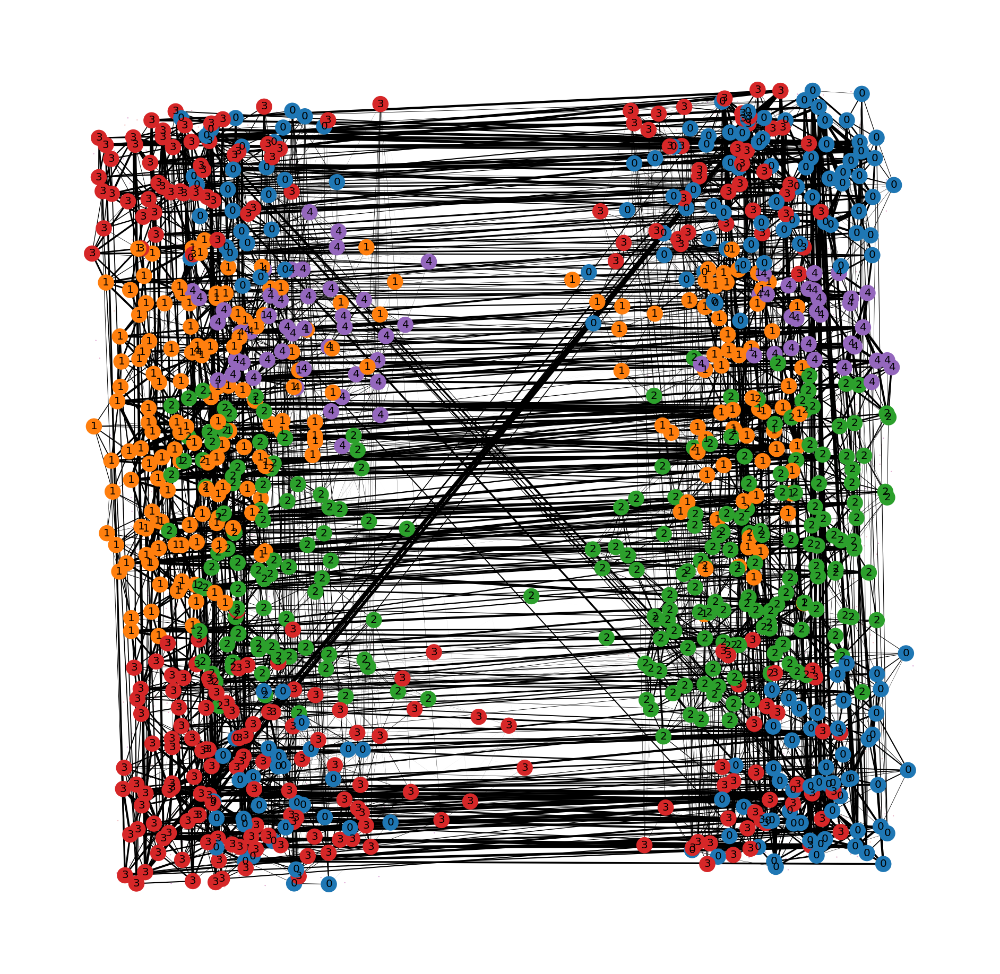

In [105]:
# Show connectivity between proto_clusters, might be used to inform n_clusters in the next step
ebc.plot_graph(tau=1, show_labels=True)

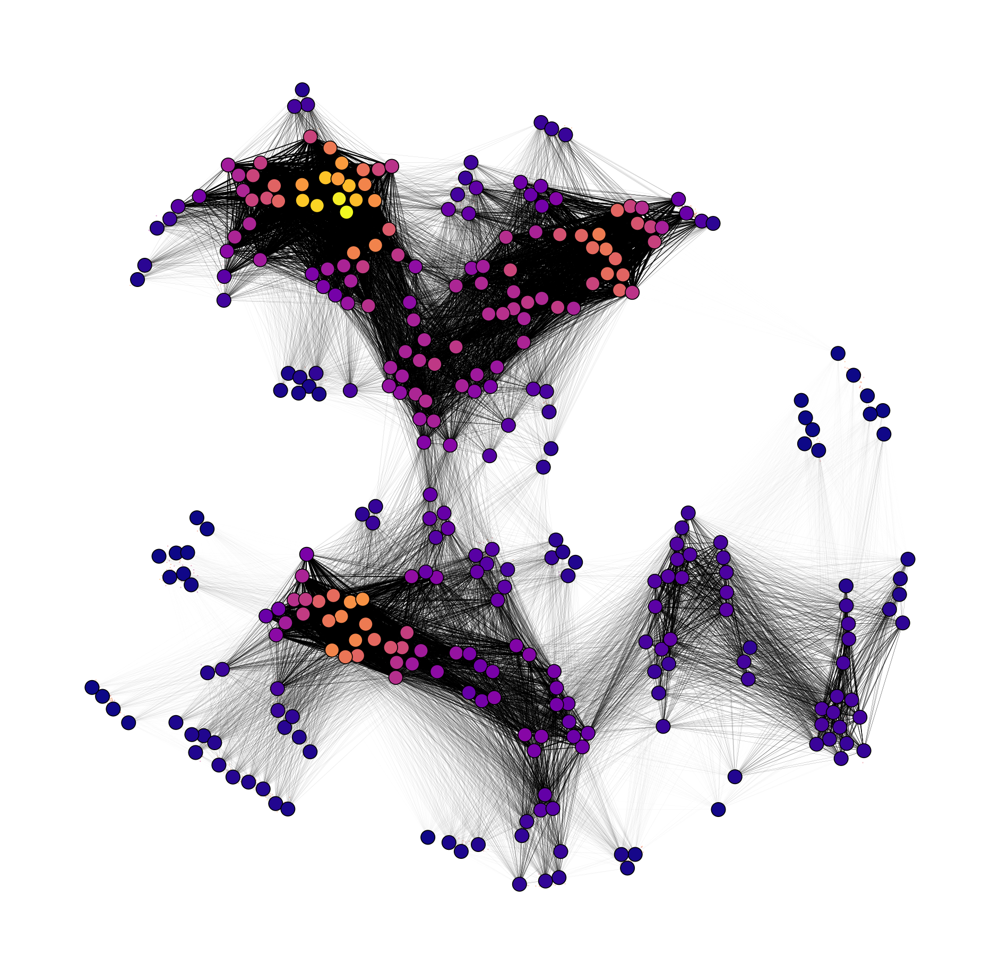

In [50]:
# Show connectivity between proto_clusters, might be used to inform n_clusters in the next step
ebc.plot_graph(tau=20, show_labels=False)

In [51]:
ebc.extract_clusters(n_clusters=6)

In [52]:
import matplotlib.pyplot as plt

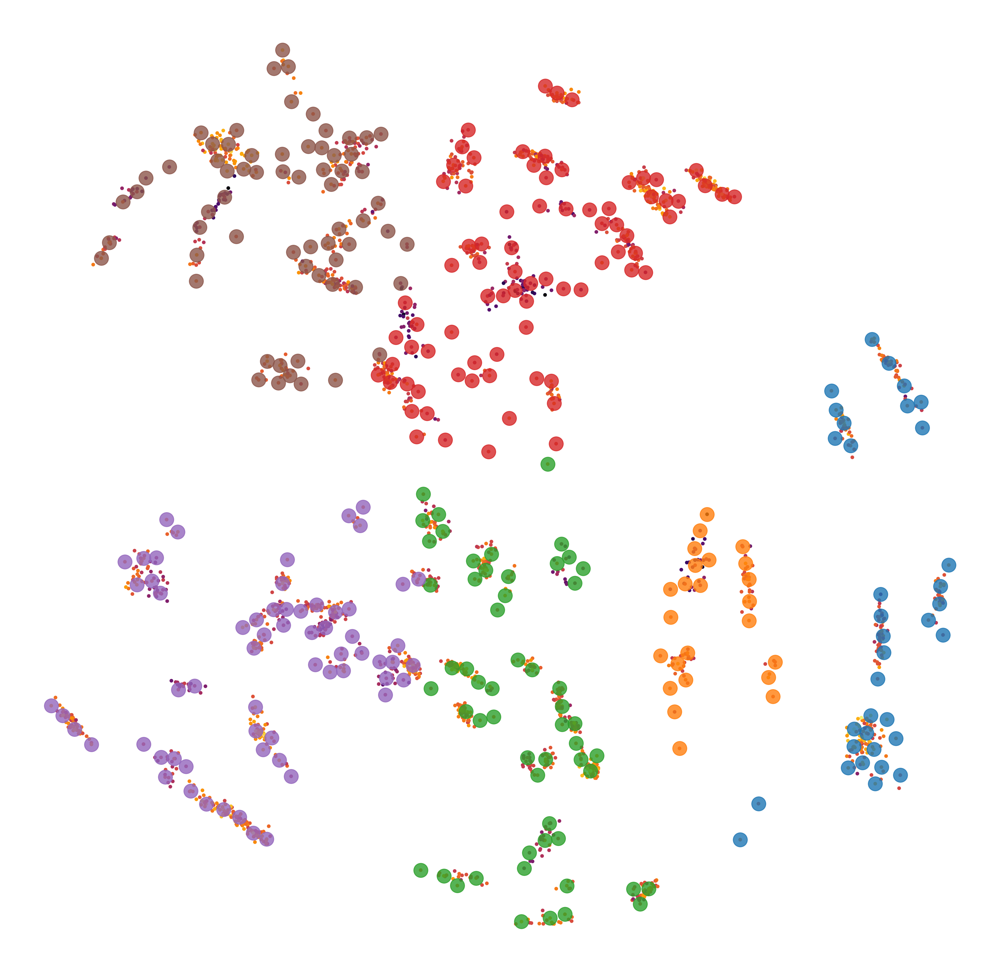

In [53]:
ebc.show()

In [106]:
# Save conformations of highest populated state of each cluster as xyz
ebc.write_clusters(mol)

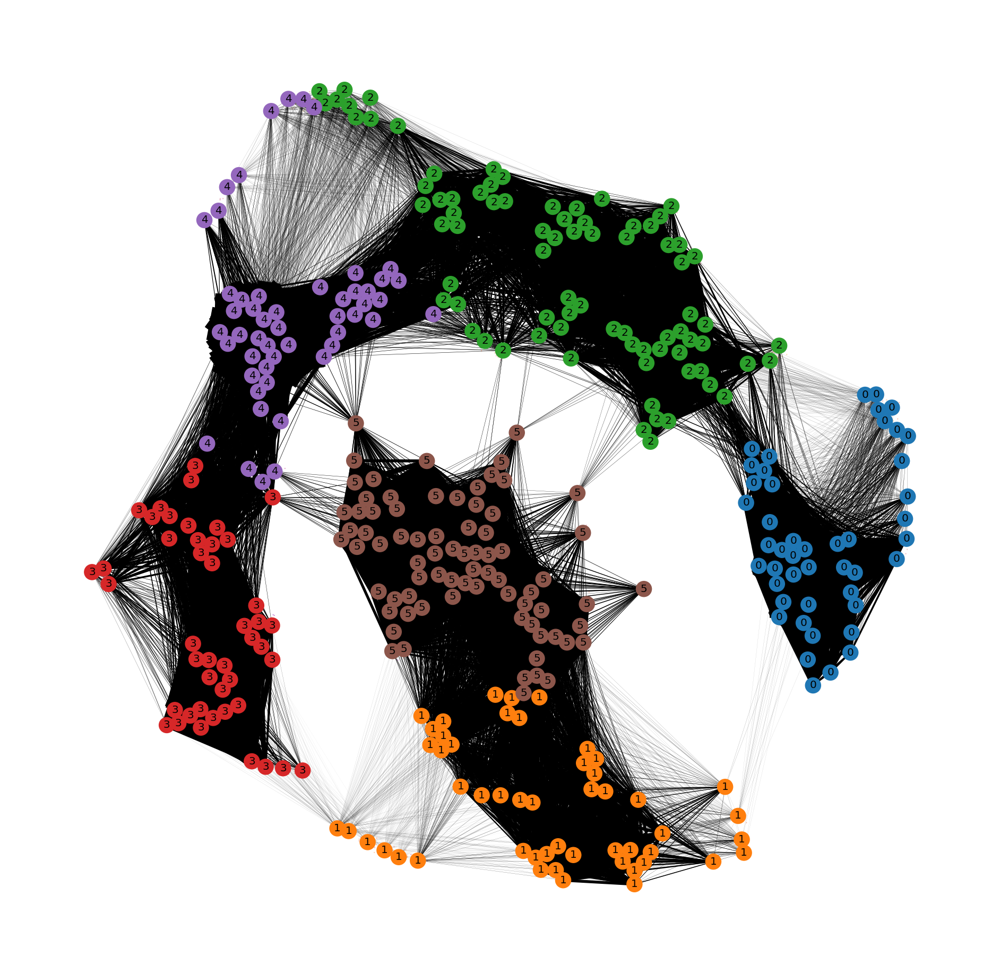

In [36]:
# Shows the corresponding labels
ebc.plot_graph(scaling=1e2, tau=10, show_labels=True)